In [1]:
import xarray as xr
import numpy as np
import pandas as pd

import metpy.calc as calc
from metpy.units import units
from metpy.plots import SkewT, Hodograph
import metpy as mp

from wrf import smooth2d, interplevel

import matplotlib.pyplot as plt
import cartopy.crs as crs
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

from datetime import datetime
from siphon.simplewebservice.wyoming import WyomingUpperAir
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

In [2]:
# ds = xr.open_dataset(r"C:\Users\gkbrk\Desktop\sinoptik yılsonu\Veri\pressure_levels.nc")
# ds_sfc = xr.open_dataset(r"C:\Users\gkbrk\Desktop\sinoptik yılsonu\Veri\single_level.nc")

ds = xr.open_dataset(r"/Users/gkbrkgrr/Desktop/MTO Projects/Synoptic Case Study/Veri/pressure_levels.nc")
ds_sfc = xr.open_dataset(r"/Users/gkbrkgrr/Desktop/MTO Projects/Synoptic Case Study/Veri/single_level.nc")

In [ ]:
"""
* [ 200,  300,  500,  700,  850,  950, 1000]
* 850 frontogenesis map tekrar bakılacak
"""

In [ ]:
"""
to do

850 equivalent pot temp, slp
850 frontogenesis map

trajektory??
izantropik harita 320K 
kar

"""

# Hesaplamalar

In [11]:
div = ds.d  # 1/s
geop = ds.z  # m2/s2
rh = ds.r
sh = ds.q
msl = ds_sfc.msl
temp = ds.t
temp2m = ds_sfc.t2m

msl_smoothed = (smooth2d(ds_sfc.msl, 20).values * units.Pa).to(units.hPa)

temp_smoothed = (smooth2d(ds.t, 20).values * units.K).to(units.degC)
temp2m_smoothed = (smooth2d(ds_sfc.t2m, 20).values * units.K).to(units.degC)

pot_vo = ds.pv
vo = ds.vo * 10**5

total_precip = (ds_sfc.tp.values * units.m).to(units.mm)
ciwc = ds.ciwc.sum(dim=['level'])
clwc = ds.clwc
crwc = ds.crwc

u = ds.u
u_kt = (ds.u.values * units('m/s')).to(units.kt)

v = ds.v
v_kt = (ds.v.values * units('m/s')).to(units.kt)

u10 = ds_sfc.u10
u10_kt = (ds_sfc.u10.values * units('m/s')).to(units.kt)

v10 = ds_sfc.v10
v10_kt = (ds_sfc.v10.values * units('m/s')).to(units.kt)

geostrophic_u, geostrophic_v = (calc.geostrophic_wind(geop))
geostrophic_u_kt = (geostrophic_u.values * units('m/s')).to(units.kt)
geostrophic_v_kt = (geostrophic_v.values * units('m/s')).to(units.kt)

vert_v = (ds.w.values * units('Pa/s')).to(units('hPa/h'))

lat = ds.latitude
lon = ds.longitude
time = ds.time

In [25]:
height = ((calc.geopotential_to_height(geop)).values * units.meter).to(units.dam)
wind = calc.wind_speed(u, v)  # ms
wind_kt = (wind.values * units('m/s')).to(units.kt)
wind10 = calc.wind_speed(u10, v10) # ms
dewpoint = calc.dewpoint_from_relative_humidity(temp, rh) # deg_C
d_depression = (temp_smoothed - dewpoint).values * units.degC

abs_vo = calc.absolute_vorticity(u, v, latitude=lat)  # 1/s

temp_adv = (calc.advection(temp, u, v).values * units('K/s')).to(units('K/h'))
height_adv = (calc.advection(height, u, v).magnitude * units('dam/s')).to(units('dam/h'))
abs_vo_adv = (calc.advection(abs_vo, u, v).values * units('1/s^2')).to(units('1/h^2'))

#pot_temp = calc.potential_temperature(pressure=[1000, 950, 850, 700, 500, 300, 200] * units.hPa, temperature=temp)
#front_850 = calc.frontogenesis(pot_temp_850, u[:, 4], v[:, 4])

/opt/anaconda3/envs/mto/lib/python3.11/site-packages/metpy/calc/thermo.py:1341: UserWarning: Relative humidity >120%, ensure proper units.
  warnings.warn('Relative humidity >120%, ensure proper units.')
/opt/anaconda3/envs/mto/lib/python3.11/site-packages/metpy/calc/thermo.py:1384: RuntimeWarning: invalid value encountered in log
  val = np.log(vapor_pressure / mpconsts.nounit.sat_pressure_0c)


In [72]:
dx, dy = calc.lat_lon_grid_deltas(lon.values, lat.values)
uqvect, vqvect = calc.q_vector(u[0, 2], v[0, 2], temp[0, 2], 500 * units.hPa, dx, dy)
q_div = -2*calc.divergence(uqvect, vqvect, dx=dx, dy=dy)

# Haritalar

## 850 mb Haritaları

### qDiv

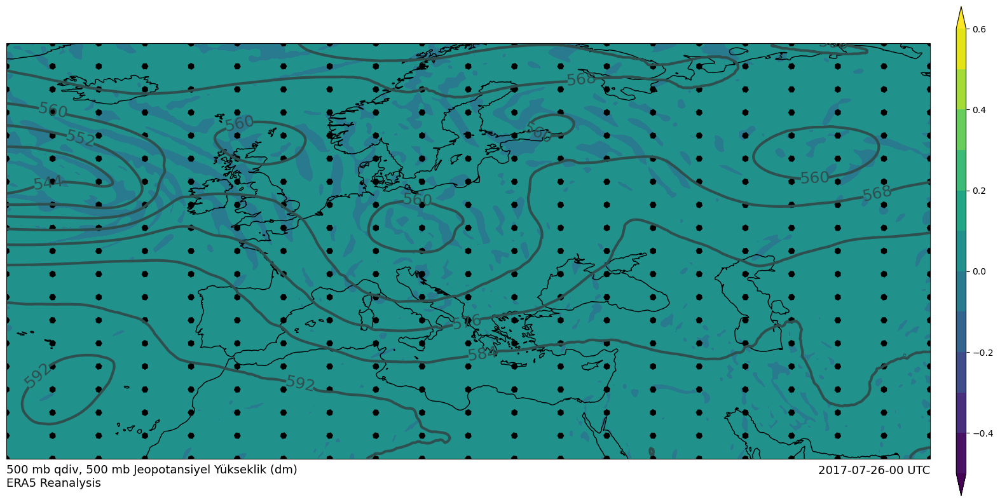

In [99]:
cmap_850t = ListedColormap(["deeppink","crimson","maroon","tab:red","orangered","tomato","darkorange","goldenrod","gold","tab:olive","palegreen","limegreen","forestgreen","turquoise","tab:cyan","deepskyblue","steelblue","royalblue","slateblue","rebeccapurple"])
levels_850t = np.arange(-40, 45, 5)

timestep = 0
degisken = 20

dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

lats = 0


# contour = plt.contour(lon, lat, temp[timestep, 4], transform=crs.PlateCarree(), colors='white')
# plt.clabel(contour, inline=True, fontsize=18, fmt='%1.0f', colors='white')

contour1 = plt.contour(lon, lat, height[timestep, 2], transform=crs.PlateCarree(), colors='darkslategray', linewidths=3)
plt.clabel(contour1, inline=True, fontsize=18, fmt='%1.0f', colors='darkslategray')
# qvec = ax.quiver(lon.values[::degisken], lat.values[::degisken],
#                  u_qvect[timestep, ::degisken, ::degisken] * 1e12, v_qvect[timestep, ::degisken, ::degisken] * 1e12,
#                  color='black', scale=10000, alpha=0.5, width=0.01)
# qk = ax.quiverkey(qvec, 0.8, 0.9, 1, r'$200 m^2/kg/s$', labelpos='E',
#                   coordinates='figure')

plt.contourf(lon, lat, q_div, transform=crs.PlateCarree() , extend='both', levels=np.arange(-0.5, 0.7, 0.1))
plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5))

for i in lat.to_numpy()[::interval_lat]:
        lons = 0
        for j in lon.to_numpy()[::interval_lon]:
            plt.quiver(j, i, uqvect[lats, lons] * 1e10, vqvect[lats, lons] * 1e10, transform=crs.PlateCarree(), scale=1000)
            lons += interval_lon
        lats += interval_lat



plt.title('850 mb qdiv, 500 mb Jeopotansiyel Yükseklik (dm)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)
plt.show()

### Pot Temp, Height

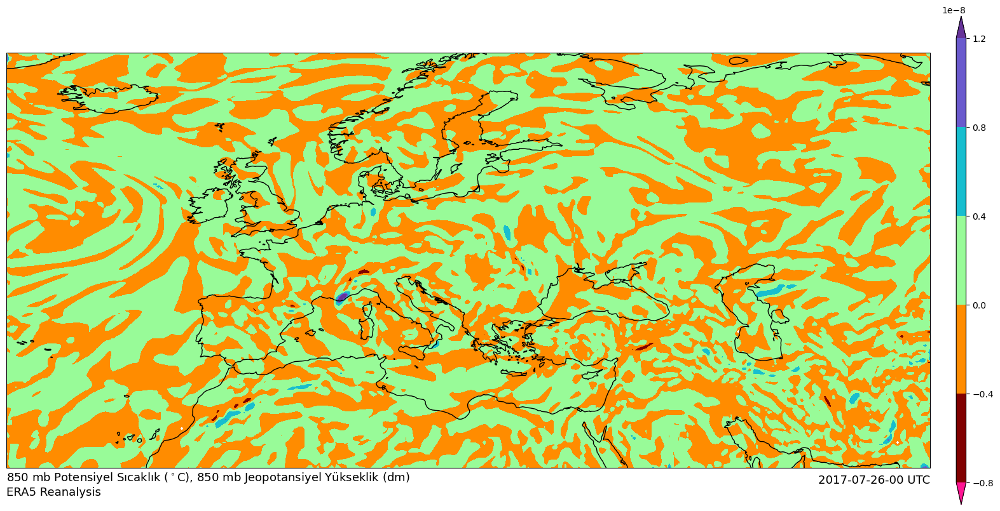

In [78]:
cmap_850t = ListedColormap(["deeppink","crimson","maroon","tab:red","orangered","tomato","darkorange","goldenrod","gold","tab:olive","palegreen","limegreen","forestgreen","turquoise","tab:cyan","deepskyblue","steelblue","royalblue","slateblue","rebeccapurple"])
levels_850t = np.arange(-40, 45, 5)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()


# contour = plt.contour(lon, lat, temp[timestep, 4], transform=crs.PlateCarree(), colors='white')
# plt.clabel(contour, inline=True, fontsize=18, fmt='%1.0f', colors='white')

# contour1 = plt.contour(lon, lat, height[timestep, 4], transform=crs.PlateCarree(), colors='darkslategray', linewidths=3)
# plt.clabel(contour1, inline=True, fontsize=18, fmt='%1.0f', colors='darkslategray')

plt.contourf(lon, lat, front_850[timestep], transform=crs.PlateCarree() , cmap=cmap_850t, extend='both')

plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5))

plt.title('850 mb Potensiyel Sıcaklık ($^\circ$C), 850 mb Jeopotansiyel Yükseklik (dm)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)
plt.show()

### Temp, Height

In [178]:
np.min(height[:, 4])

118.824295 <Unit('decameter')>

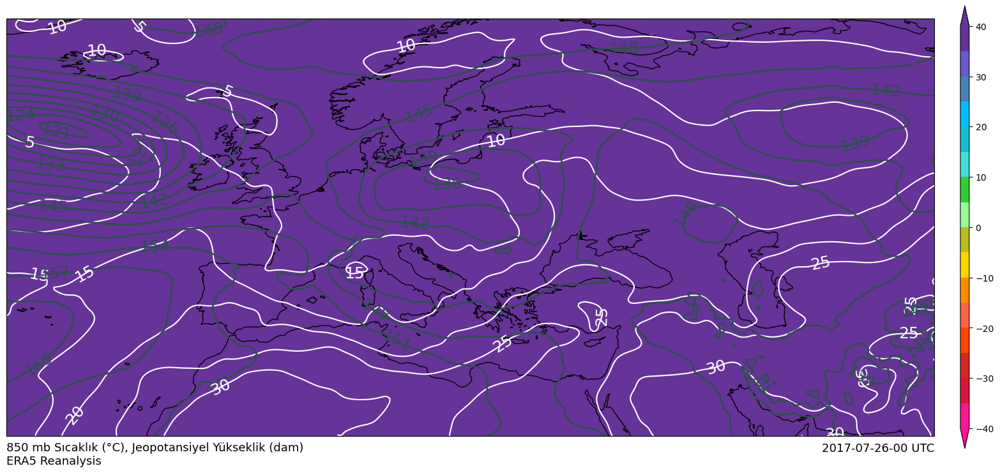

In [179]:
cmap_850t = ListedColormap(["deeppink","crimson","maroon","tab:red","orangered","tomato","darkorange","goldenrod","gold","tab:olive","palegreen","limegreen","forestgreen","turquoise","tab:cyan","deepskyblue","steelblue","royalblue","slateblue","rebeccapurple"])
levels_850t = np.arange(-40, 45, 5)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

contour = plt.contour(lon, lat, temp_smoothed[timestep, 4], transform=crs.PlateCarree(), colors='white')
plt.clabel(contour, inline=True, fontsize=18, fmt='%1.0f', colors='white')

contour1 = plt.contour(lon, lat, height[timestep, 4], transform=crs.PlateCarree(), colors='darkslategray', linewidths=2, levels=np.arange(100, 200, 3))
plt.clabel(contour1, inline=True, fontsize=18, fmt='%1.0f', colors='darkslategray')

plt.contourf(lon, lat, temp[timestep, 4], transform=crs.PlateCarree() , cmap=cmap_850t, extend='both', levels=levels_850t)

plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5), shrink=.9)

plt.title(f'850 mb Sıcaklık ({temp_smoothed.units:~P}), Jeopotansiyel Yükseklik (dam)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)
plt.show()

###  Rel. Vort, Wind

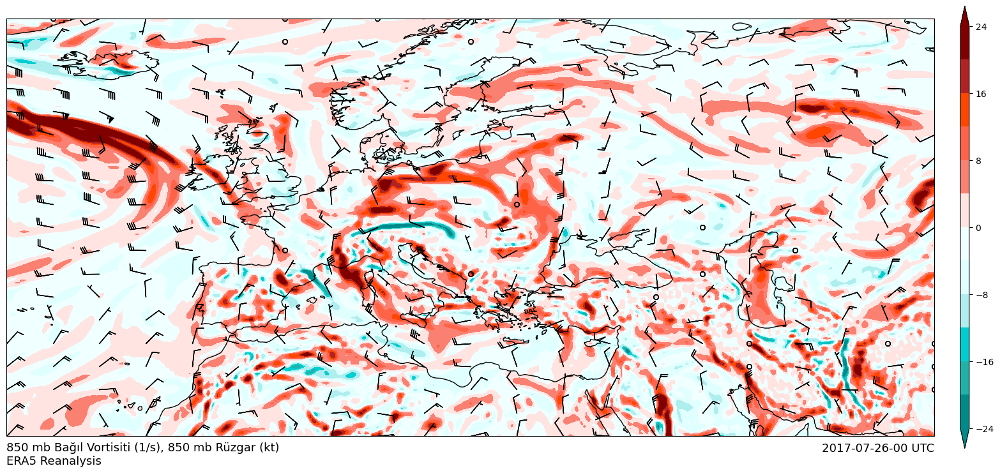

In [157]:
cmap_850v_r = ListedColormap(["darkcyan","lightseagreen","darkturquoise","paleturquoise","lightcyan", "azure","mistyrose", "salmon","tomato","orangered","firebrick","maroon"])
levels_850v = np.arange(-24, 28, 4)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

plt.contourf(lon, lat, vo[timestep, 4, :, :], transform=crs.PlateCarree() , cmap=cmap_850v_r, extend='both', levels=levels_850v)

for i in lat.to_numpy()[::interval_lat]:
        lons = 0
        for j in lon.to_numpy()[::interval_lon]:
            plt.barbs(j, i, u_kt[timestep, 4, lats, lons], v_kt[timestep, 4, lats, lons], transform=crs.PlateCarree(), length=6)
            lons += interval_lon
        lats += interval_lat

plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5), shrink=.9)

plt.title('850 mb Bağıl Vortisiti (1/s), Rüzgar (kt)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### Temp Adv, Height

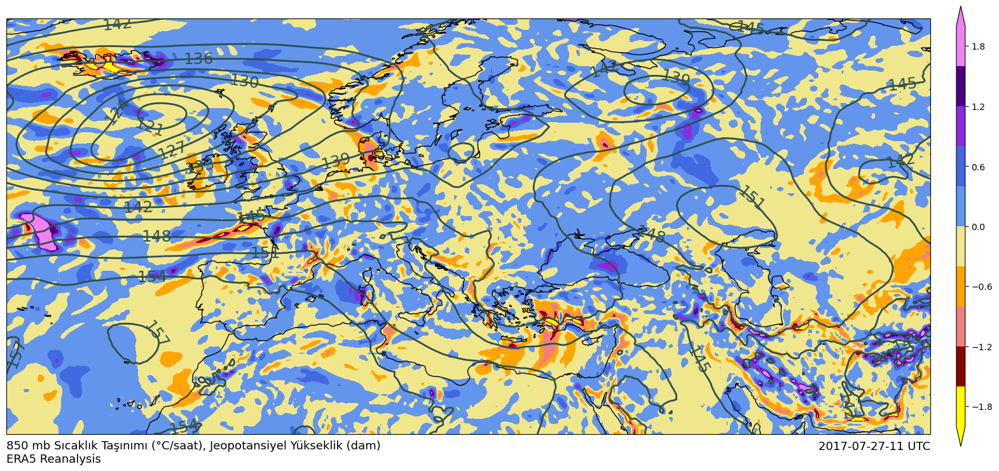

In [180]:
cmap_850adv = ListedColormap(["yellow","darkred","lightcoral","orange","khaki","cornflowerblue","royalblue","blueviolet","indigo","violet"])
levels_850adv = np.arange(-2, 2.2, 0.2)

timestep = 35
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

contour = plt.contour(lon, lat, height[timestep, 4], transform=crs.PlateCarree(), colors='darkslategray', linewidths=2, levels=np.arange(100, 200, 3))
plt.clabel(contour, inline=True, fontsize=18, fmt='%1.0f', colors='darkslategray')

plt.contourf(lon, lat, temp_adv[timestep, 4], transform=crs.PlateCarree() , extend='both', levels=levels_850adv, cmap=cmap_850adv)

plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5), shrink=.9)

plt.title(f'850 mb Sıcaklık Taşınımı ({temp_smoothed.units:~P}/saat), Jeopotansiyel Yükseklik (dam)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)
plt.show()


### Kart

In [160]:
np.min(height[timestep, 4])

119.72018 <Unit('decameter')>

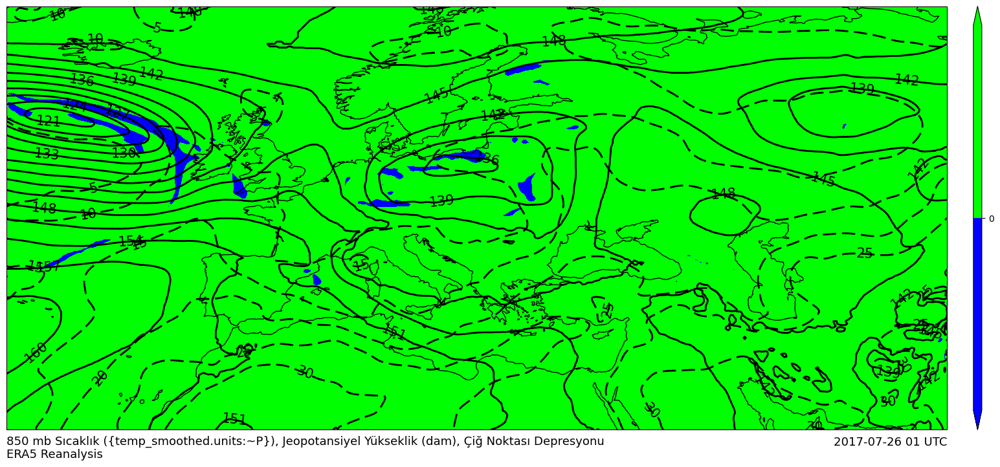

In [170]:
colors = [(0, 0, 1), (1, 1, 1), (0, 1, 0)]  # Blue -> White -> Red
n_bins = 2  # More bins will give a smoother transition
cmap = LinearSegmentedColormap.from_list('custom_colormap', colors, N=n_bins)

timestep = 1
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d %H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20


fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

contour = plt.contour(lon, lat, temp_smoothed[timestep, 4], transform=crs.PlateCarree(),
                      linewidths=2, levels=np.arange(0, 40, 5), colors='black', linestyles='dashed')

plt.clabel(contour, inline=True, fontsize=15, fmt='%1.0f', colors='black')

contour = plt.contour(lon, lat, height[timestep, 4], transform=crs.PlateCarree(),
                      linewidths=2, colors='black', levels=np.arange(100, 200, 3))

plt.clabel(contour, inline=True, fontsize=15, fmt='%1.0f', colors='black')

# for i in lat.to_numpy()[::interval_lat]:
#         lons = 0
#         for j in lon.to_numpy()[::interval_lon]:
#             plt.barbs(j, i, u_kt[timestep, 4, lats, lons], v_kt[timestep, 4, lats, lons], transform=crs.PlateCarree(), length=6)
#             lons += interval_lon
#         lats += interval_lat


plt.contourf(lon, lat, d_depression[timestep, 4], transform=crs.PlateCarree(), levels=[-5, 0, 5], extend='both', cmap=cmap)

plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5), shrink=.85, ticks=[0])


plt.title('850 mb Sıcaklık ({temp_smoothed.units:~P}), Jeopotansiyel Yükseklik (dam), Çiğ Noktası Depresyonu\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)
plt.show()

## 700 mb Haritaları

### Temp, Height

In [174]:
np.min(height[:, 3])

275.41367 <Unit('decameter')>

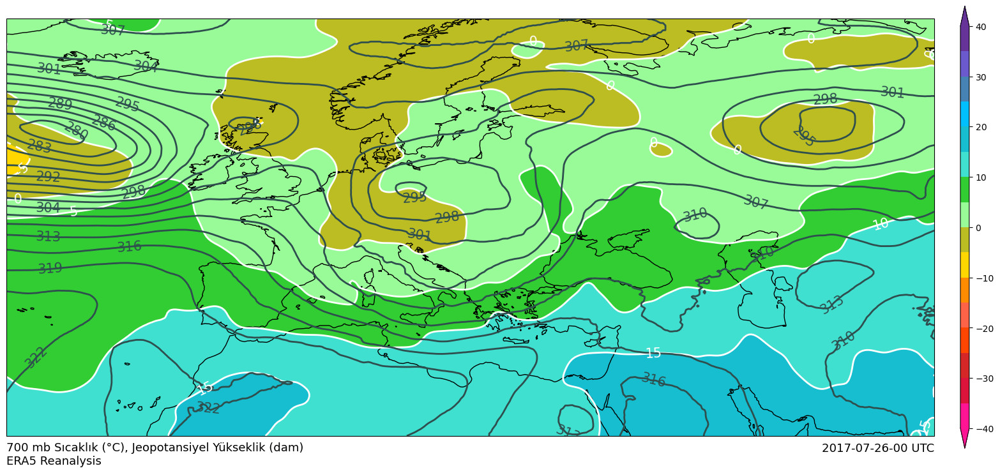

In [175]:
cmap_700t = ListedColormap(["deeppink","crimson","maroon","tab:red","orangered","tomato","darkorange","goldenrod","gold","tab:olive","palegreen","limegreen","forestgreen","turquoise","tab:cyan","deepskyblue","steelblue","royalblue","slateblue","rebeccapurple"])
levels_700t = np.arange(-40, 45, 5)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

contour = plt.contour(lon, lat, temp_smoothed[timestep, 3], transform=crs.PlateCarree(), colors='white', levels=levels_700t, linewidths=2)
plt.clabel(contour, inline=True, fontsize=15, fmt='%1.0f', colors='white')

contour1 = plt.contour(lon, lat, height[timestep, 3], transform=crs.PlateCarree(), colors='darkslategray', linewidths=2, levels=np.arange(250, 350, 3))
plt.clabel(contour1, inline=True, fontsize=15, fmt='%1.0f', colors='darkslategray')

plt.contourf(lon, lat, temp_smoothed[timestep, 3], transform=crs.PlateCarree() , cmap=cmap_700t, extend='both', levels=levels_700t)

plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5), shrink=.9)

plt.title(f'700 mb Sıcaklık ({temp_smoothed.units:~P}), Jeopotansiyel Yükseklik (dam)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)
plt.show()

### RH

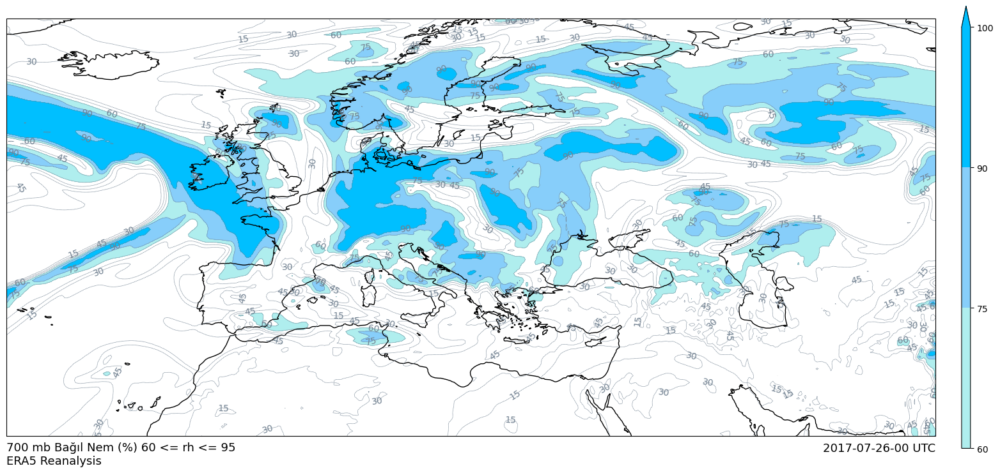

In [170]:
cmap_700rh = ListedColormap(["paleturquoise","lightskyblue","deepskyblue"])

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

contour = plt.contour(lon, lat, rh[timestep, 3], colors='slategrey', levels=[15, 30, 45, 60, 75, 90], linestyles='--', linewidths=0.5)
plt.clabel(contour, inline=True, fontsize=10, fmt='%1.0f', colors='slategrey')

plt.contourf(lon, lat, rh[timestep, 3], transform=crs.PlateCarree() , cmap=cmap_700rh, extend='max', levels=[60, 75, 90, 100])

plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, anchor=(-0.15, 0.5), shrink=.9)

plt.title('700 mb Bağıl Nem (%) 60 <= rh <= 95\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### Rel. Vor, Wind

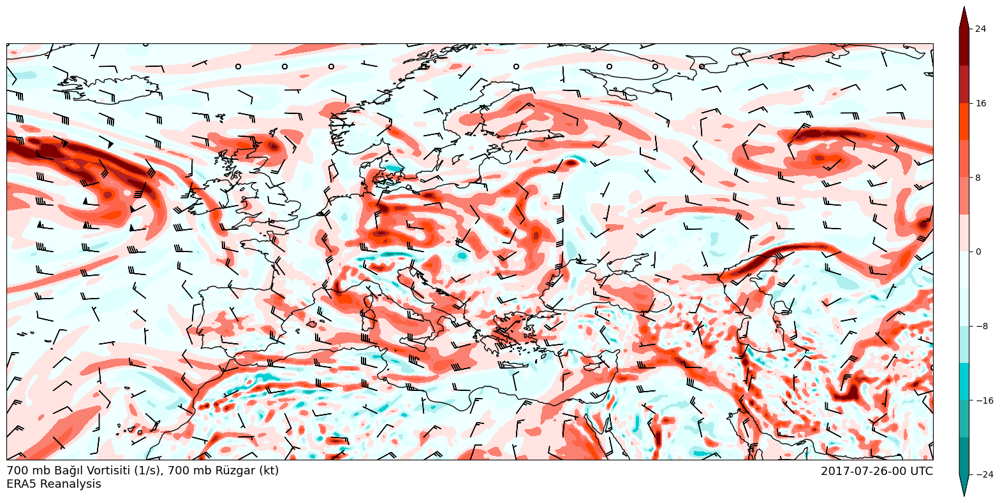

In [165]:
cmap_700v = ListedColormap(["maroon","firebrick","orangered","tomato","salmon", "mistyrose","azure", "lightcyan","paleturquoise","darkturquoise","cadetblue","darkcyan"])
cmap_700v_r = ListedColormap(["darkcyan","lightseagreen","darkturquoise","paleturquoise","lightcyan", "azure","mistyrose", "salmon","tomato","orangered","firebrick","maroon"])
levels_850v = np.arange(-24, 28, 4)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()
        
plt.contourf(lon, lat, vo[timestep, 3], transform=crs.PlateCarree() , cmap=cmap_700v_r, extend='both', levels=levels_850v)

for i in lat.to_numpy()[::interval_lat]:
        lons = 0
        for j in lon.to_numpy()[::interval_lon]:
            plt.barbs(j, i, u_kt[timestep, 3, lats, lons], v_kt[timestep, 3, lats, lons], transform=crs.PlateCarree(), length=6)
            lons += interval_lon
        lats += interval_lat
        
        
plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5))

plt.title('700 mb Bağıl Vortisiti (1/s), 700 mb Rüzgar (kt)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### Vertical Vel, Height

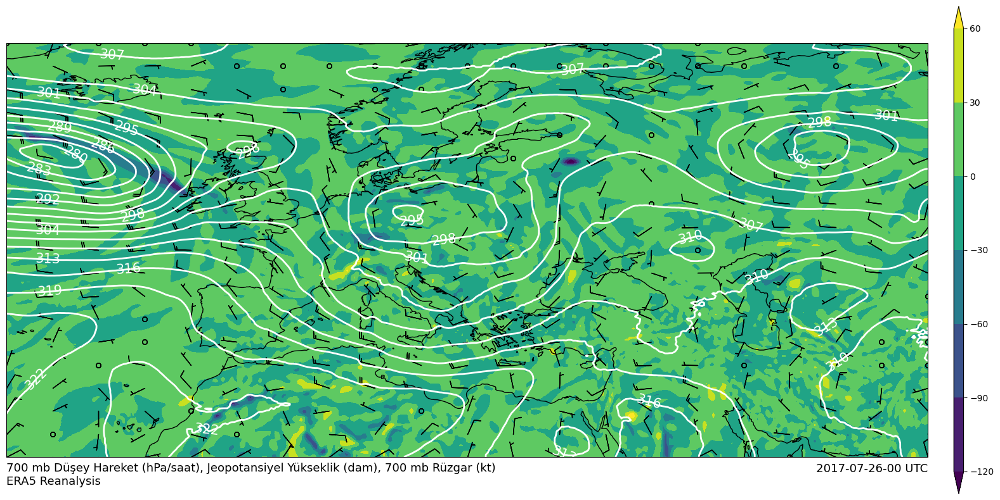

In [176]:
"""
contourf levels?
"""

cmap_700v = ListedColormap(["maroon","firebrick","orangered","tomato","salmon", "mistyrose","azure", "lightcyan","paleturquoise","darkturquoise","cadetblue","darkcyan"])
cmap_700v_r = ListedColormap(["darkcyan","lightseagreen","darkturquoise","paleturquoise","lightcyan", "azure","mistyrose", "salmon","tomato","orangered","firebrick","maroon"])
levels_850v = np.arange(-24, 28, 4)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()
        
contour = plt.contour(lon, lat, height[timestep, 3], transform=crs.PlateCarree(), colors='white', levels=np.arange(250, 350, 3), linewidths=2)
plt.clabel(contour, inline=True, fontsize=15, fmt='%1.0f', colors='white')

plt.contourf(lon, lat, vert_v[timestep, 3], transform=crs.PlateCarree(), extend='both')

for i in lat.to_numpy()[::interval_lat]:
        lons = 0
        for j in lon.to_numpy()[::interval_lon]:
            plt.barbs(j, i, u[timestep, 3, lats, lons], v[timestep, 3, lats, lons], transform=crs.PlateCarree(), length=6)
            lons += interval_lon
        lats += interval_lat
        
        
plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5))

plt.title('700 mb Düşey Hareket (hPa/saat), Jeopotansiyel Yükseklik (dam), 700 mb Rüzgar (kt)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### Kart 1

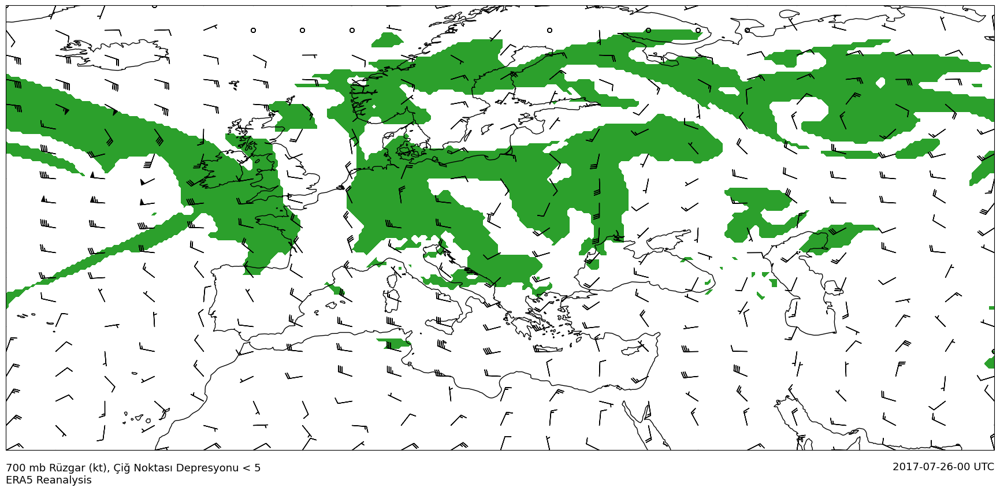

In [173]:
cmap_700v = ListedColormap(["maroon","firebrick","orangered","tomato","salmon", "mistyrose","azure", "lightcyan","paleturquoise","darkturquoise","cadetblue","darkcyan"])
cmap_700v_r = ListedColormap(["darkcyan","lightseagreen","darkturquoise","paleturquoise","lightcyan", "azure","mistyrose", "salmon","tomato","orangered","firebrick","maroon"])
levels_850v = np.arange(-24, 28, 4)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats=0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

# contour = plt.contour(lon, lat, wind_kt[timestep, 3], transform=crs.PlateCarree(), colors='black')
# plt.clabel(contour, inline=True, fontsize=18, fmt='%1.0f', colors='black')
        
# plt.quiver(lon, lat, u_kt[timestep, 3], v_kt[timestep, 3], level = )

plt.contourf(lon, lat, np.ma.masked_greater_equal(d_depression[timestep, 3], 5) < 5, transform=crs.PlateCarree(), colors='tab:green')

for i in lat.to_numpy()[::interval_lat]:
        lons = 0
        for j in lon.to_numpy()[::interval_lon]:
            plt.barbs(j, i, u_kt[timestep, 3, lats, lons], v_kt[timestep, 3, lats, lons], transform=crs.PlateCarree(), length=6)
            lons += interval_lon
        lats += interval_lat
        
        
#plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5))

plt.title('700 mb Rüzgar (kt), Çiğ Noktası Depresyonu < 5\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### Kart 2

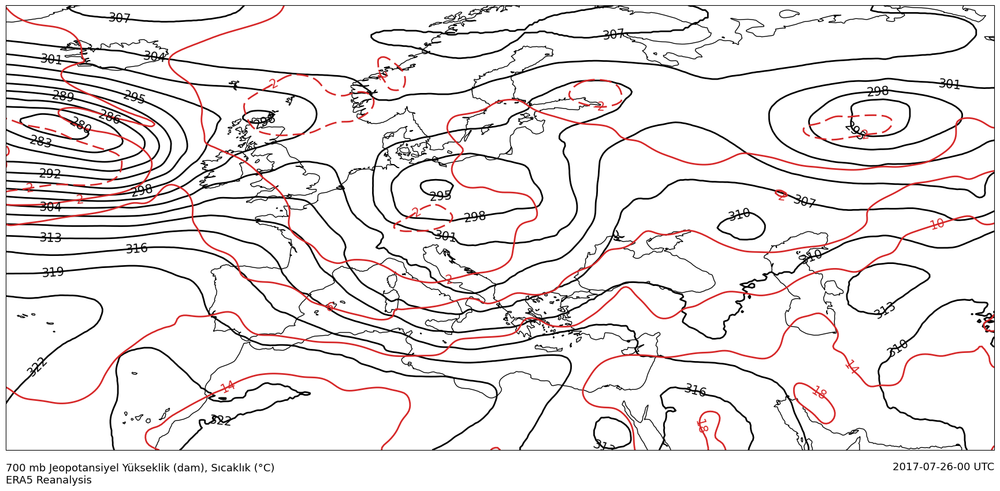

In [177]:
cmap_700v = ListedColormap(["maroon","firebrick","orangered","tomato","salmon", "mistyrose","azure", "lightcyan","paleturquoise","darkturquoise","cadetblue","darkcyan"])
cmap_700v_r = ListedColormap(["darkcyan","lightseagreen","darkturquoise","paleturquoise","lightcyan", "azure","mistyrose", "salmon","tomato","orangered","firebrick","maroon"])
levels_850v = np.arange(-24, 28, 4)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()
        
contour = plt.contour(lon, lat, height[timestep, 3], transform=crs.PlateCarree(), colors='black', levels=np.arange(250, 350, 3), linewidths=2)
plt.clabel(contour, inline=True, fontsize=15, fmt='%1.0f', colors='black')

contour1 = plt.contour(lon, lat, temp_smoothed[timestep, 3], transform=crs.PlateCarree(), colors='tab:red', levels=np.arange(-10, 27, 4), linewidths=2)
plt.clabel(contour1, inline=True, fontsize=15, fmt='%1.0f', colors='tab:red')

#plt.contourf(lon, lat, vert_v[timestep, 3], transform=crs.PlateCarree(), extend='both')

# for i in lat.to_numpy()[::interval_lat]:
#         lons = 0
#         for j in lon.to_numpy()[::interval_lon]:
#             plt.quiver(j, i, u[timestep, 3, lats, lons], v[timestep, 3, lats, lons], transform=crs.PlateCarree(), width=0.0025)
#             lons += interval_lon
#         lats += interval_lat
        
        
#plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5))

plt.title(f'700 mb Jeopotansiyel Yükseklik (dam), Sıcaklık ({temp_smoothed.units:~P})\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

## 500 mb Haritaları

### Height, Temp

In [136]:
np.max(temp_smoothed[:, 2])

-0.305542 <Unit('degree_Celsius')>

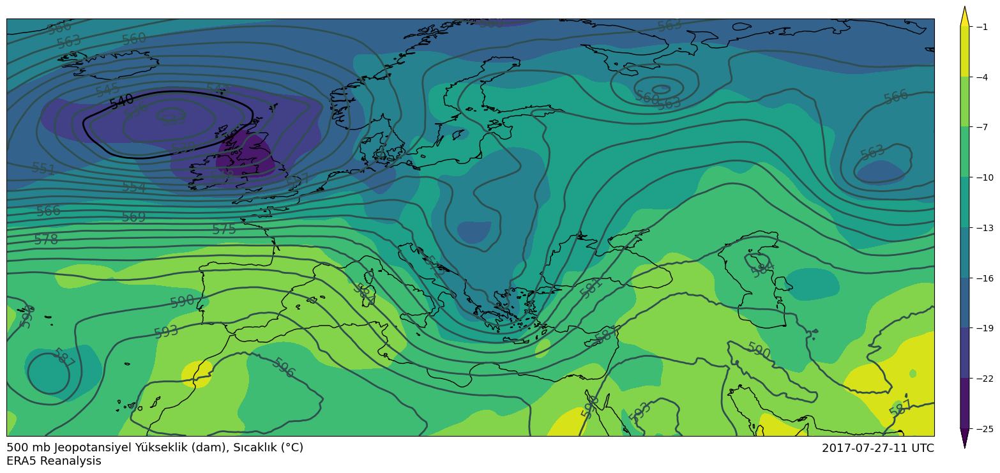

In [189]:
cmap_500h = ListedColormap(["fuchsia","purple","darkblue","royalblue","dodgerblue","lightblue","azure","mistyrose","lightsalmon","orangered","indianred","tab:red","maroon","deeppink"])
levels_500h = np.arange(480, 620, 10)

timestep = 35
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

contour= plt.contour(lon, lat, height[timestep, 2], colors='darkslategray', linewidths=2, levels=np.arange(500, 606, 3))
plt.clabel(contour, inline=True, fontsize=15, fmt='%1.0f', colors='darkslategray')

contour = plt.contour(lon, lat, height[timestep, 2], colors='black', linewidths=2, levels=[540])
plt.clabel(contour, inline=True, fontsize=15, fmt='%1.0f', colors='black')

plt.contourf(lon, lat, temp_smoothed[timestep, 2], transform=crs.PlateCarree(), extend='both', levels=np.arange(-25, 2, 3))

plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5), shrink=.9)

plt.title(f'500 mb Jeopotansiyel Yükseklik (dam), Sıcaklık ({temp_smoothed.units:~P})\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### Msl, Thickness, Height

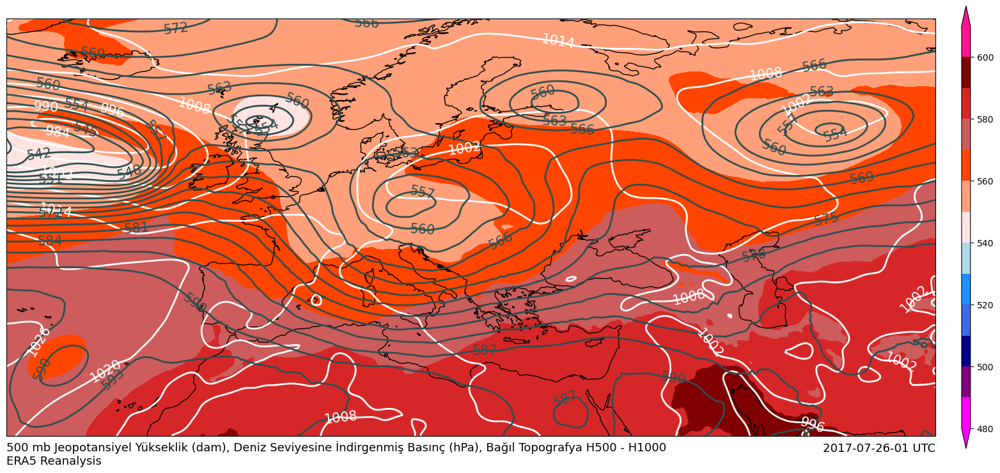

In [188]:
cmap_500h = ListedColormap(["fuchsia","purple","darkblue","royalblue","dodgerblue","lightblue","azure","mistyrose","lightsalmon","orangered","indianred","tab:red","maroon","deeppink"])
levels_500h = np.arange(480, 620, 10)

timestep = 1
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

contour_slp = plt.contour(lon, lat, msl_smoothed[timestep], colors='white', linewidths=2)
plt.clabel(contour_slp, inline=True, fontsize=15, fmt='%1.0f', colors='white')

contour_tp = plt.contour(lon, lat, height[timestep, 2], colors='darkslategray', linewidths=2, levels=np.arange(500, 606, 3))
plt.clabel(contour_tp, inline=True, fontsize=15, fmt='%1.0f', colors='darkslategray')

contour_tp = plt.contour(lon, lat, height[timestep, 2], colors='black', linewidths=2, levels=[540])
plt.clabel(contour_tp, inline=True, fontsize=15, fmt='%1.0f', colors='black')

plt.contourf(lon, lat, height[timestep, 2] - height[timestep, 6], transform=crs.PlateCarree() , cmap=cmap_500h, extend='both', levels = levels_500h)

plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5), shrink=.9)

plt.title('500 mb Jeopotansiyel Yükseklik (dam), Deniz Seviyesine İndirgenmiş Basınç (hPa), Bağıl Topografya H500 - H1000\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### Rel. Vor, Wind

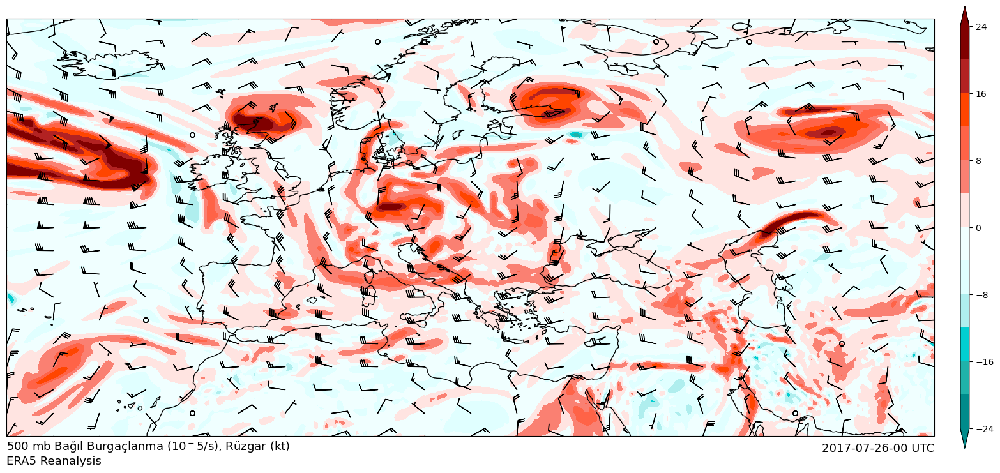

In [180]:
cmap_500v = ListedColormap(["maroon","firebrick","orangered","tomato","salmon", "mistyrose","azure", "lightcyan","paleturquoise","darkturquoise","cadetblue","darkcyan"])
cmap_500v_r = ListedColormap(["darkcyan","lightseagreen","darkturquoise","paleturquoise","lightcyan", "azure","mistyrose", "salmon","tomato","orangered","firebrick","maroon"])
levels_500v = np.arange(-24, 28, 4)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()
        
plt.contourf(lon, lat, vo[timestep, 2], transform=crs.PlateCarree() , cmap=cmap_500v_r, extend='both', levels = levels_500v)

for i in lat.to_numpy()[::interval_lat]:
        lons = 0
        for j in lon.to_numpy()[::interval_lon]:
            plt.barbs(j, i, u_kt[timestep, 2, lats, lons], v_kt[timestep, 2, lats, lons], transform=crs.PlateCarree(), length=6)
            lons += interval_lon
        lats += interval_lat
        
        
plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5), shrink=.9)

plt.title('500 mb Bağıl Burgaçlanma (10$^-5$/s), Rüzgar (kt)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### Height Adv, Height

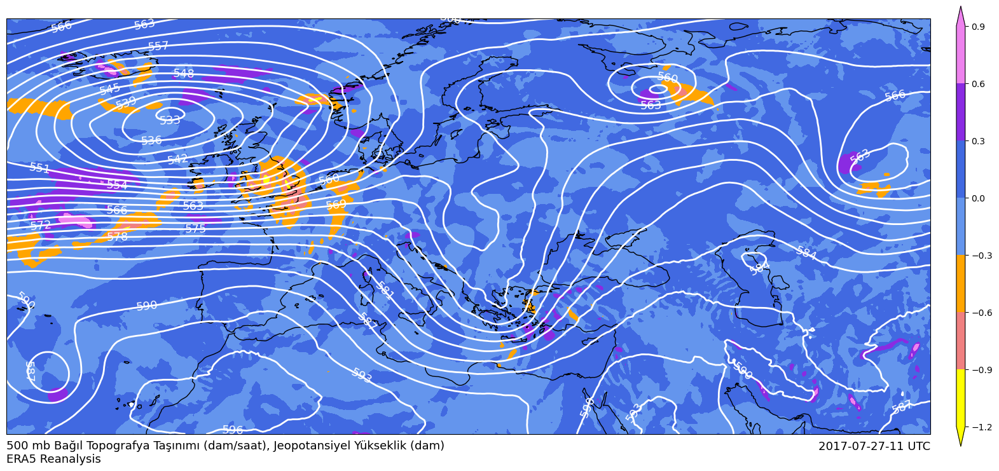

In [187]:
cmap_500rt = ListedColormap(["yellow","darkred","lightcoral","orange","khaki","cornflowerblue","royalblue","blueviolet","indigo","violet"])
levels_500rt = np.arange(-0.0005, 0.0006, 0.0001)

timestep = 35
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

contour1 = plt.contour(lon, lat, height[timestep, 2], transform=crs.PlateCarree(), colors='white', linewidths=2, levels=np.arange(500, 606, 3))
plt.clabel(contour1, inline=True, fontsize=13, fmt='%1.0f', colors='white')
        
plt.contourf(lon, lat, height_adv[timestep, 2], transform=crs.PlateCarree() , extend='both', cmap=cmap_500rt)
       
plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5), shrink=.9)

plt.title('500 mb Bağıl Topografya Taşınımı (dam/saat), Jeopotansiyel Yükseklik (dam)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### Temp Adv, Height

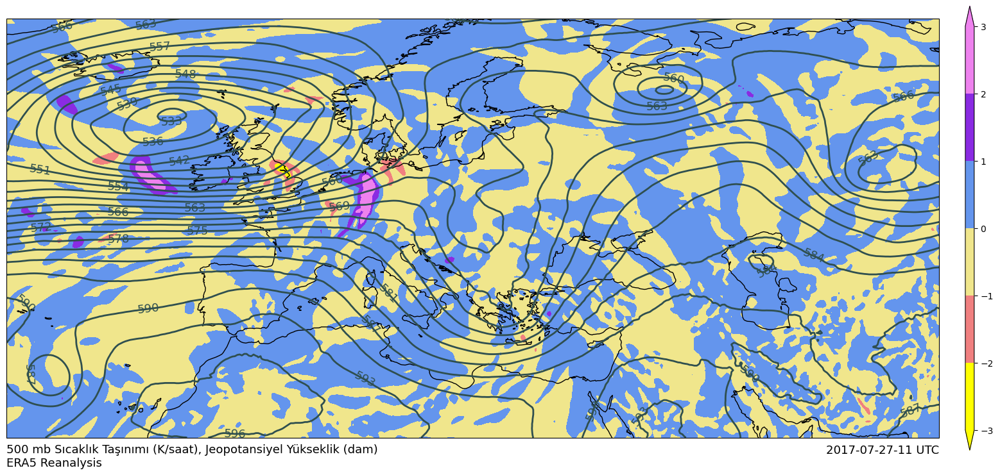

In [186]:
cmap_500rt = ListedColormap(["yellow","darkred","lightcoral","orange","khaki","cornflowerblue","royalblue","blueviolet","indigo","violet"])
levels_500rt = np.arange(-0.0005, 0.0006, 0.0001)

timestep = 35
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

contour1 = plt.contour(lon, lat, height[timestep, 2], transform=crs.PlateCarree(), colors='darkslategray', linewidths=2, levels=np.arange(500, 606, 3))
plt.clabel(contour1, inline=True, fontsize=13, fmt='%1.0f', colors='darkslategray')
        
plt.contourf(lon, lat, temp_adv[timestep, 2], transform=crs.PlateCarree() , extend='both', cmap=cmap_500rt)
       
plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5), shrink=.9)

plt.title('500 mb Sıcaklık Taşınımı (K/saat), Jeopotansiyel Yükseklik (dam)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### vert_v, Height

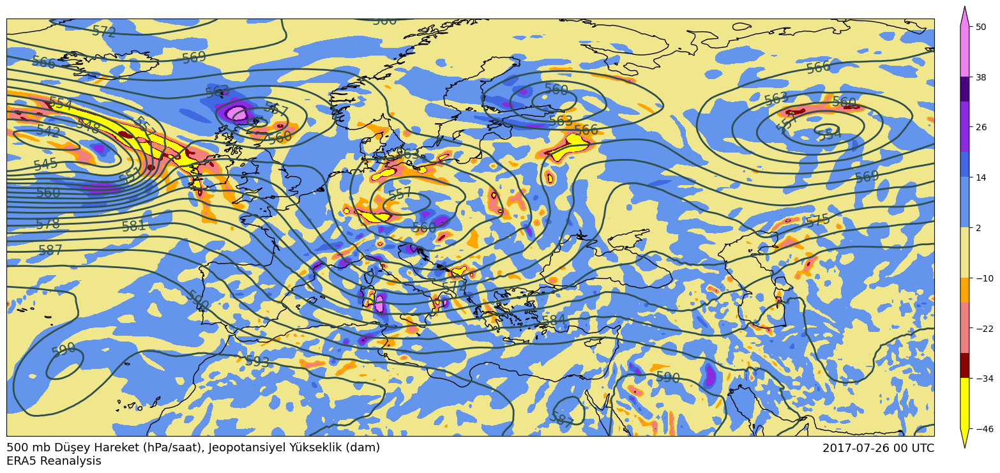

In [185]:
cmap_500w = ListedColormap(["yellow","darkred","lightcoral","orange","khaki","cornflowerblue","royalblue","blueviolet","indigo","violet"])
levels_500w = np.arange(-46, 52, 6)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d %H")[timestep]

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

contour = plt.contour(lon, lat, height[timestep, 2], transform=crs.PlateCarree(), colors='darkslategray', linewidths=2, levels=np.arange(500, 606, 3))
plt.clabel(contour, inline=True, fontsize=15, fmt='%1.0f', colors='darkslategray')

plt.contourf(lon, lat, vert_v[timestep, 2], transform=crs.PlateCarree(), extend='both', levels=levels_500w, cmap=cmap_500w)

plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5), shrink=.9)

plt.title('500 mb Düşey Hareket (hPa/saat), Jeopotansiyel Yükseklik (dam)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)
plt.show()

### Abs. Vor. Adv., Height

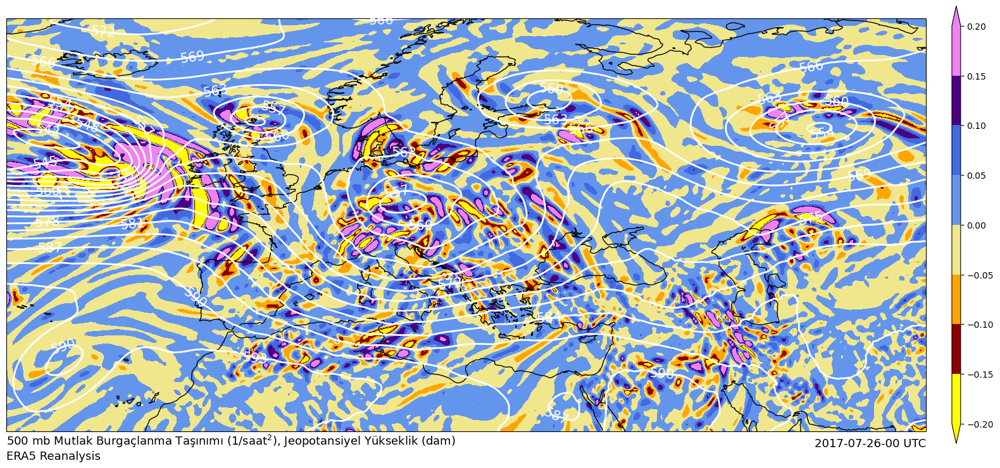

In [184]:
cmap_500absvoadv = ListedColormap(["yellow","darkred","lightcoral","orange","khaki","cornflowerblue","royalblue","blueviolet","indigo","violet"])
levels_500absvoadv = np.arange(-0.2, 0.25, 0.05)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

contour1 = plt.contour(lon, lat, height[timestep, 2], transform=crs.PlateCarree(), colors='white', linewidths=2, levels=np.arange(500, 606, 3))
plt.clabel(contour1, inline=True, fontsize=15, fmt='%1.0f', colors='white')
        
plt.contourf(lon, lat, abs_vo_adv[timestep, 2], transform=crs.PlateCarree() , extend='both', cmap=cmap_500absvoadv, levels=levels_500absvoadv)
       
plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5), shrink=.9)

plt.title('500 mb Mutlak Burgaçlanma Taşınımı (1/saat$^2$), Jeopotansiyel Yükseklik (dam)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### Div, Height

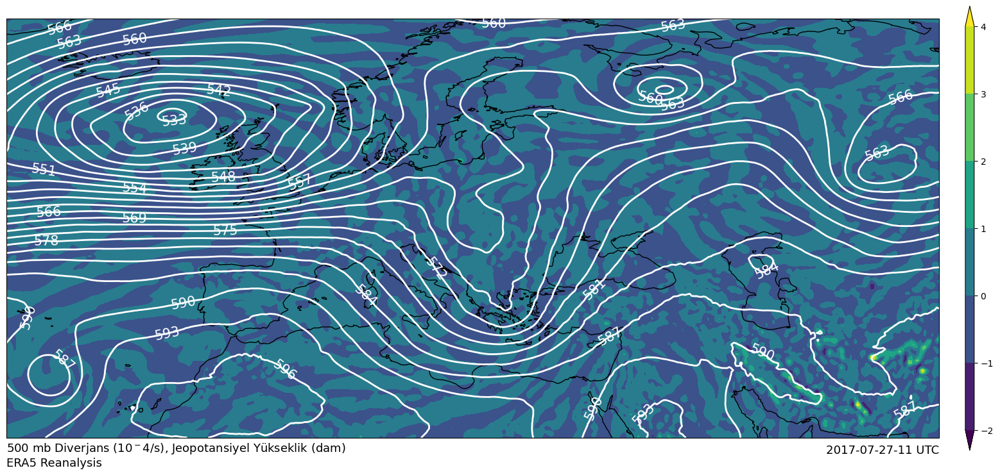

In [183]:
cmap_500absvoadv = ListedColormap(["yellow","darkred","lightcoral","orange","khaki","cornflowerblue","royalblue","blueviolet","indigo","violet"])
levels_500absvoadv = np.arange(-0.0005, 0.0006, 0.0001)

timestep = 35
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

contour1 = plt.contour(lon, lat, height[timestep, 2], transform=crs.PlateCarree(), colors='white', linewidths=2, levels=np.arange(500, 606, 3))
plt.clabel(contour1, inline=True, fontsize=15, fmt='%1.0f', colors='white')
        
plt.contourf(lon, lat, div[timestep, 2] * 10**4, transform=crs.PlateCarree() , extend='both')
       
plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5), shrink=.9)

plt.title('500 mb Diverjans (10$^-4$/s), Jeopotansiyel Yükseklik (dam)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### Jet, Height

In [91]:
threshold = 15

# Create mask where wind speed is greater than the threshold
mask = wind.values > threshold

# Apply the mask only to the wind components
u_masked = np.ma.masked_where(~mask, u)
v_masked = np.ma.masked_where(~mask, v)

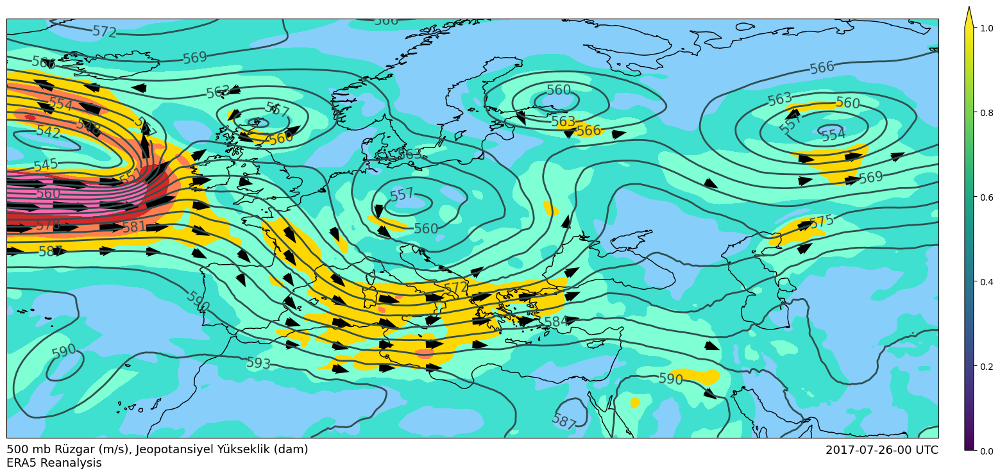

In [92]:
cmap_500h = ListedColormap(["lightskyblue","turquoise","aquamarine","palegreen","gold","coral","tab:red","hotpink"])
levels_500h = np.arange(25, 70, 5)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()
        
contour = plt.contour(lon, lat, height[timestep, 2], colors='darkslategray', linewidths=2, levels=np.arange(500, 606, 3))
plt.clabel(contour, inline=True, fontsize=15, fmt='%1.0f', colors='darkslategray')

plt.contourf(lon, lat, wind[timestep, 2], transform=crs.PlateCarree() , cmap=cmap_500h, extend='max')

for i in lat.to_numpy()[::interval_lat]:
        lons = 0
        for j in lon.to_numpy()[::interval_lon]:
            plt.quiver(j, i, u_masked[timestep, 2, lats, lons], v_masked[timestep, 2, lats, lons], transform=crs.PlateCarree(), 
                       scale=1000, headlength=2, headwidth=1.5, headaxislength=1.8)
            lons += interval_lon
        lats += interval_lat

        
plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend='max', anchor=(-0.15, 0.5), shrink=.9)

plt.title(f'500 mb Rüzgar (m/s), Jeopotansiyel Yükseklik (dam)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### Kart

In [95]:
np.max(temp_smoothed[:, 2])

-0.305542 <Unit('degree_Celsius')>

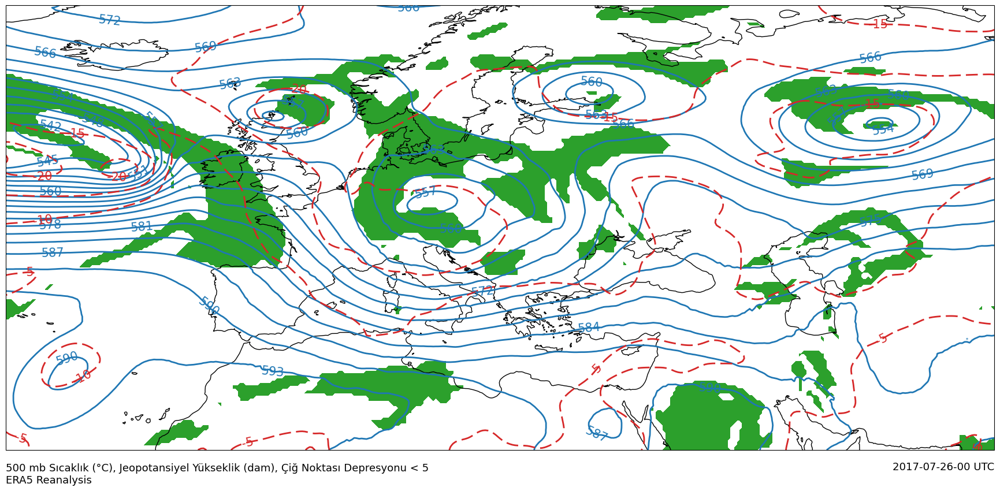

In [181]:
cmap_500h = ListedColormap(["lightskyblue","turquoise","aquamarine","palegreen","gold","coral","tab:red","hotpink"])
levels_500h = np.arange(25, 70, 5)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()
        
contour = plt.contour(lon, lat, height[timestep, 2], colors='tab:blue', linewidths=2, levels=np.arange(500, 606, 3))
plt.clabel(contour, inline=True, fontsize=15, fmt='%1.0f', colors='tab:blue')

contour1 = plt.contour(lon, lat, temp_smoothed[timestep, 2], colors='tab:red', linewidths=2, linestyles='dashed', levels=np.arange(-35, 0, 5))
plt.clabel(contour1, inline=True, fontsize=15, fmt='%1.0f', colors='tab:red')

plt.contourf(lon, lat, np.ma.masked_greater_equal(d_depression[timestep, 2], 5) < 5, transform=crs.PlateCarree(), levels=np.arange(0, 6, 1), colors='tab:green')

# for i in lat.to_numpy()[::interval_lat]:
#         lons = 0
#         for j in lon.to_numpy()[::interval_lon]:
#             plt.barbs(j, i, u_kt[timestep, 2, lats, lons], v_kt[timestep, 2, lats, lons], transform=crs.PlateCarree(), length=6)
#             lons += interval_lon
#         lats += interval_lat

        
#plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend='max', anchor=(-0.15, 0.5), shrink=.9, ticks=np.arange(-5, 6, 1))

plt.title(f'500 mb Sıcaklık ({temp_smoothed.units:~P}), Jeopotansiyel Yükseklik (dam), Çiğ Noktası Depresyonu < 5 \nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

## 300 mb Haritaları

### Rel. Vor, Wind

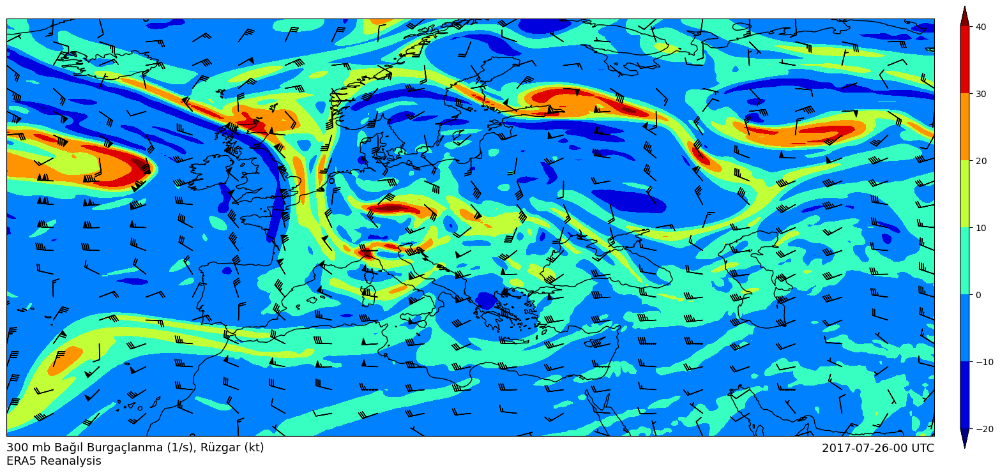

In [184]:
timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()
        
plt.contourf(lon, lat, vo[timestep, 1], transform=crs.PlateCarree() , cmap='jet', extend='both')

for i in lat.to_numpy()[::interval_lat]:
        lons = 0
        for j in lon.to_numpy()[::interval_lon]:
            plt.barbs(j, i, u_kt[timestep, 1, lats, lons], v_kt[timestep, 1, lats, lons], transform=crs.PlateCarree(), length=6)
            lons += interval_lon
        lats += interval_lat
        
        
plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5), shrink=.9)

plt.title('300 mb Bağıl Burgaçlanma (1/s), Rüzgar (kt)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### Jet, Height

In [96]:
np.max(wind[:, 1])

<xarray.DataArray ()>
<Quantity(73.71061706542969, 'meter / second')>
Coordinates:
    level    int32 300

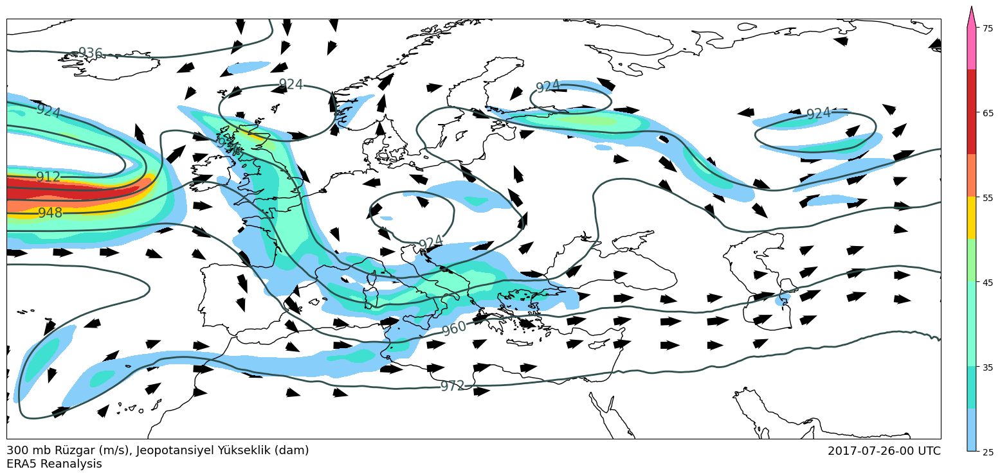

In [97]:
cmap_500v = ListedColormap(["maroon","firebrick","orangered","tomato","salmon", "mistyrose","azure", "lightcyan","paleturquoise","darkturquoise","cadetblue","darkcyan"])
cmap_500h = ListedColormap(["lightskyblue","turquoise","aquamarine","palegreen","gold","coral","tab:red","hotpink"])
levels_500h = np.arange(25, 80, 5)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()
        
contour = plt.contour(lon, lat, height[timestep, 1], colors='darkslategray', linewidths=2, levels=np.arange(900, 1120, 12))
plt.clabel(contour, inline=True, fontsize=15, fmt='%1.0f', colors='darkslategray')

for i in lat.to_numpy()[::interval_lat]:
        lons = 0
        for j in lon.to_numpy()[::interval_lon]:
            plt.quiver(j, i, u_masked[timestep, 1, lats, lons], v_masked[timestep, 1, lats, lons], transform=crs.PlateCarree(), 
                       scale=1000, headlength=2, headwidth=1.5, headaxislength=1.8)
            lons += interval_lon
        lats += interval_lat


plt.contourf(lon, lat, wind[timestep, 1], transform=crs.PlateCarree() , cmap=cmap_500h, extend='max', levels=levels_500h)
plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend='max', anchor=(-0.15, 0.5), shrink=.9)

plt.title('300 mb Rüzgar (m/s), Jeopotansiyel Yükseklik (dam)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### Kart

In [117]:
np.max(wind_kt[:, 1])

143.28197 <Unit('knot')>

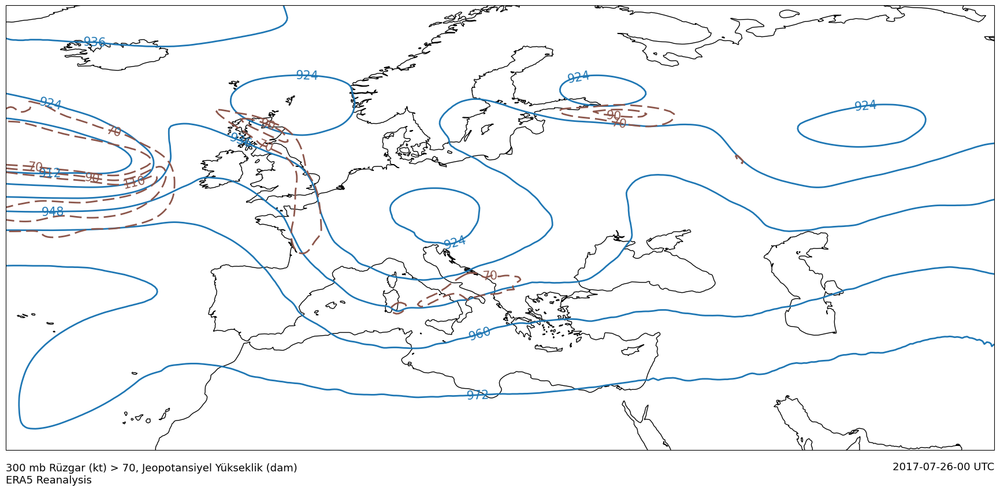

In [187]:
cmap_500v = ListedColormap(["maroon","firebrick","orangered","tomato","salmon", "mistyrose","azure", "lightcyan","paleturquoise","darkturquoise","cadetblue","darkcyan"])
cmap_500h = ListedColormap(["lightskyblue","turquoise","aquamarine","palegreen","gold","coral","tab:red","hotpink"])
levels_500h = np.arange(25, 70, 5)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

lats = 0
interval_lat = 10
interval_lon = 20

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()
        
contour = plt.contour(lon, lat, height[timestep, 1], colors='tab:blue', linewidths=2, levels=np.arange(900, 1120, 12))
plt.clabel(contour, inline=True, fontsize=15, fmt='%1.0f', colors='tab:blue')

contour = plt.contour(lon, lat, wind_kt[timestep, 1], colors='tab:brown', linewidths=2, levels=np.arange(70, 170, 20), linestyles='dashed')
plt.clabel(contour, inline=True, fontsize=15, fmt='%1.0f', colors='tab:brown')

#plt.contourf(lon, lat, wind[timestep, 1], transform=crs.PlateCarree() , cmap=cmap_500h, extend='max', levels=levels_500h)

# for i in lat.to_numpy()[::interval_lat]:
#         lons = 0
#         for j in lon.to_numpy()[::interval_lon]:
#             plt.barbs(j, i, u_kt[timestep, 1, lats, lons], v_kt[timestep, 1, lats, lons], transform=crs.PlateCarree(), length=6)
#             lons += interval_lon
#         lats += interval_lat

        
#plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend='max', anchor=(-0.15, 0.5), shrink=.9)

plt.title('300 mb Rüzgar (kt) > 70, Jeopotansiyel Yükseklik (dam)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

## Seviyesiz Haritalar

### CIWC

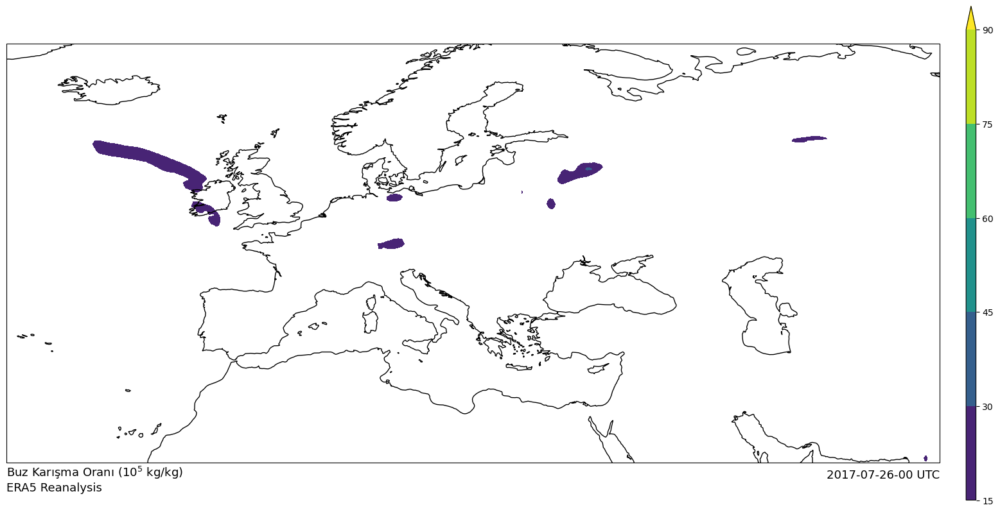

In [56]:
cmap_ciwc = ListedColormap(["maroon","firebrick","orangered","tomato","salmon", "mistyrose","azure", "lightcyan","paleturquoise","darkturquoise","cadetblue","darkcyan"])
levels_ciwc = np.arange(15, 100, 15)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

plt.contourf(lon, lat, ciwc[timestep, :, :] * 10**5, transform=crs.PlateCarree() , extend='max', levels=levels_ciwc)

plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="max", anchor=(-0.15, 0.5))

plt.title('Buz Karışma Oranı (10$^5$ kg/kg)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### T2M

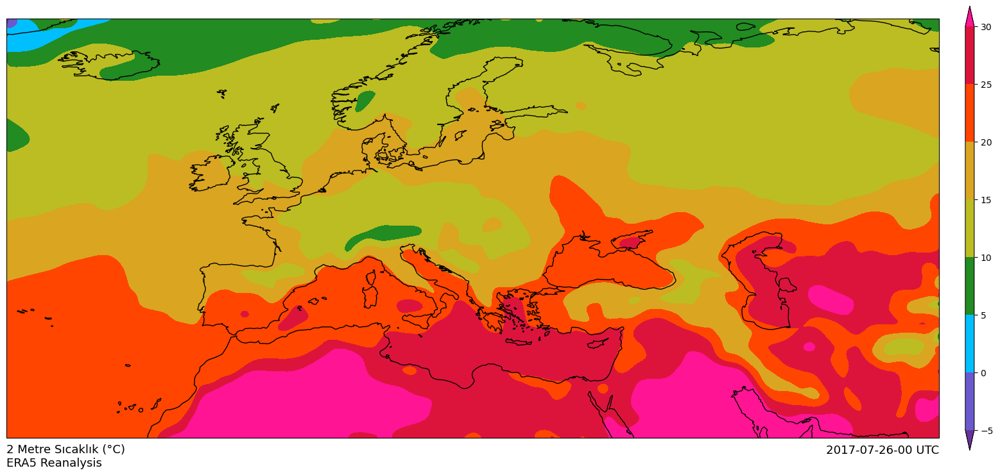

In [45]:
cmap_t2m = ListedColormap(["deeppink","crimson","maroon","tab:red","orangered","tomato","darkorange","goldenrod","gold","tab:olive","palegreen","limegreen","forestgreen","turquoise","tab:cyan","deepskyblue","steelblue","royalblue","slateblue","rebeccapurple"])
cmap_t2m_r = ListedColormap(["rebeccapurple","slateblue","royalblue","steelblue","deepskyblue","tab:cyan","turquoise","forestgreen","limegreen","palegreen","tab:olive","gold","goldenrod","darkorange","tomato","orangered","tab:red","maroon","crimson","deeppink"])
levels_t2m = np.arange(-5, 35, 5)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

plt.contourf(lon, lat, temp2m_smoothed[timestep], transform=crs.PlateCarree() , extend='both', cmap=cmap_t2m_r, levels=levels_t2m)

plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="both", anchor=(-0.15, 0.5), shrink=.9)

plt.title(f'2 Metre Sıcaklık ({temp2m_smoothed.units:~P})\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### Total Precip

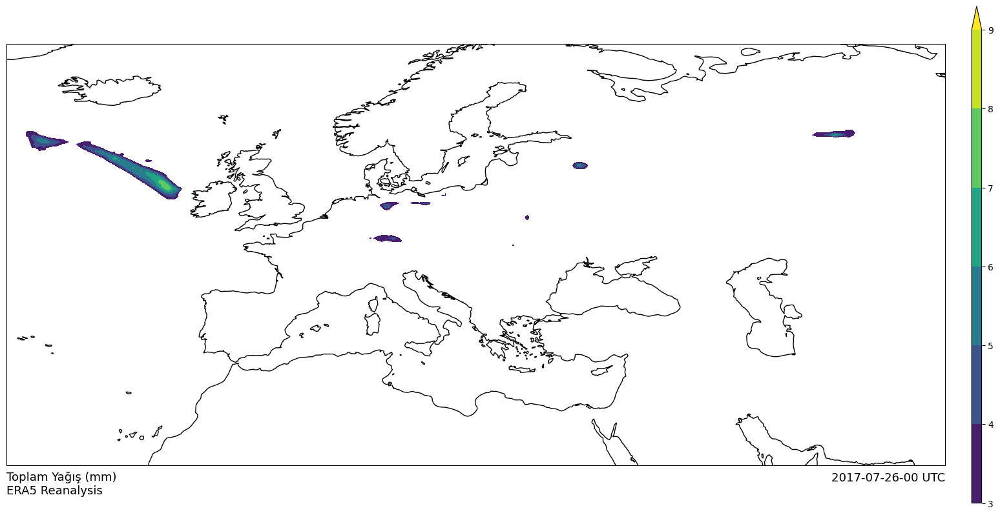

In [237]:
cmap_t2m = ListedColormap(["deeppink","crimson","maroon","tab:red","orangered","tomato","darkorange","goldenrod","gold","tab:olive","palegreen","limegreen","forestgreen","turquoise","tab:cyan","deepskyblue","steelblue","royalblue","slateblue","rebeccapurple"])
levels_tp = np.arange(3, 10, 1)

timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d-%H")[timestep]

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

plt.contourf(lon, lat, total_precip[timestep], transform=crs.PlateCarree() , extend='max', levels=levels_tp)

plt.colorbar(ax=ax, orientation="vertical", fraction=0.2, aspect=50, extend="max", anchor=(-0.15, 0.5))

plt.title('Toplam Yağış (mm)\nERA5 Reanalysis', loc='left', pad=20, fontsize=13, y=-0.11)
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)

plt.show()

### MSL, T2M

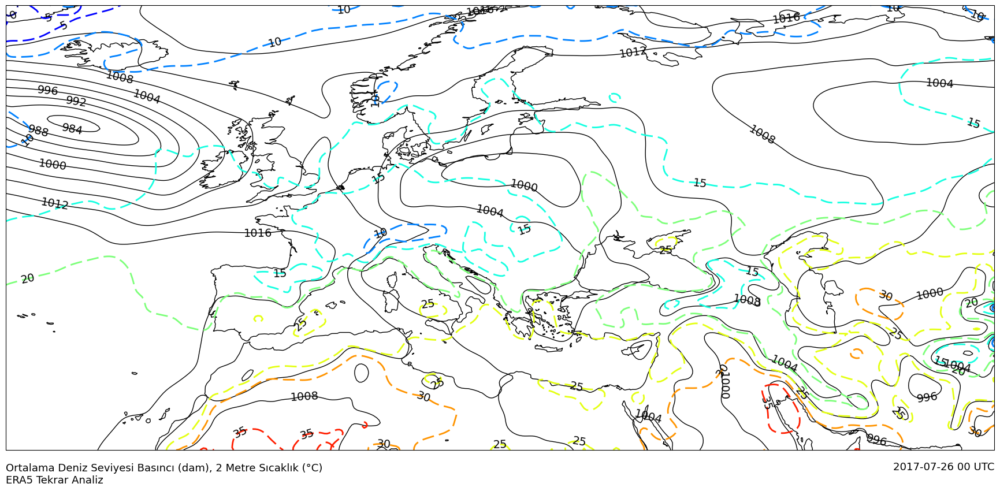

In [48]:
timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d %H")[timestep]

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

contour = plt.contour(lon, lat, msl_smoothed[timestep], transform=crs.PlateCarree(), colors='black',
                      levels=np.arange(984, 1014 + 4, 4), linewidths=1)
plt.clabel(contour, inline=True, fontsize=14, fmt='%1.0f', colors='black')

contour1 = plt.contour(lon, lat, temp2m_smoothed[timestep], transform=crs.PlateCarree(),
                        linewidths=2, linestyles='dashed', levels=np.arange(0, 45, 5), cmap="jet")
plt.clabel(contour1, inline=True, fontsize=14, fmt='%1.0f', colors='black')


plt.title(f'Ortalama Deniz Seviyesi Basıncı (dam), 2 Metre Sıcaklık ({temp2m_smoothed.units:~P})\nERA5 Tekrar Analiz', pad=20, fontsize=13, y=-0.11, loc='left')
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)
plt.show()

### 10M Wind

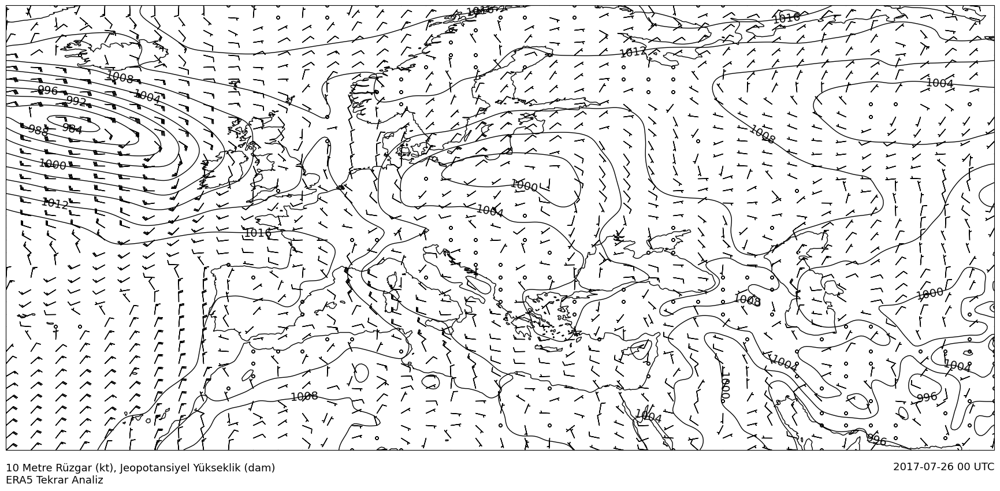

In [73]:
timestep = 0
dt_time = pd.to_datetime(time)
dtime = dt_time.strftime("%Y-%m-%d %H")[timestep]

lats = 0
interval_lat = 5
interval_lon = 10

fig = plt.figure(figsize = (25, 10))

ax = plt.axes(projection=crs.PlateCarree())
ax.coastlines()

contour = plt.contour(lon, lat, msl_smoothed[timestep], transform=crs.PlateCarree(), colors='black',
                     levels=np.arange(984, 1014 + 4, 4), linewidths=1)
plt.clabel(contour, inline=True, fontsize=14, fmt='%1.0f', colors='black')

# contour1 = plt.contour(lon, lat, t2m_smoothed[timestep], transform=crs.PlateCarree(),
#                        linewidths=2, linestyles='dashed', levels=np.arange(0, 45, 5), cmap="jet")
# plt.clabel(contour1, inline=True, fontsize=14, fmt='%1.0f', colors='black')

for i in lat.to_numpy()[::interval_lat]:
        lons = 0
        for j in lon.to_numpy()[::interval_lon]:
            plt.barbs(j, i, u10_kt[timestep, lats, lons], v10_kt[timestep, lats, lons], transform=crs.PlateCarree(), length=5)
            lons += interval_lon
        lats += interval_lat


plt.title('10 Metre Rüzgar (kt), Jeopotansiyel Yükseklik (dam)\nERA5 Tekrar Analiz', pad=20, fontsize=13, y=-0.11, loc='left')
plt.title(f'{dtime} UTC', loc='right', pad=20, fontsize=13, y=-0.08)
plt.show()

# SkewT

In [18]:
date = datetime(2017, 7, 26, 0)
dtime = date.strftime("%Y-%m-%d %H")
station = 17064
ds_sounding = WyomingUpperAir.request_data(date, station)[:58]

In [19]:
p_sounding = ds_sounding['pressure'].values * units.hPa
hgt_sounding = ds_sounding['height'].values * units.hPa
T_sounding = ds_sounding['temperature'].values * units.degC
Td_sounding = ds_sounding['dewpoint'].values * units.degC
rh_sounding = calc.relative_humidity_from_dewpoint(T_sounding, Td_sounding)
wind_speed_sounding = ds_sounding['speed'].values * units.knots
u_sounding = ds_sounding['u_wind'].values * units.knots
v_sounding = ds_sounding['v_wind'].values * units.knots

prof = calc.parcel_profile(p_sounding, T_sounding[0], Td_sounding[0]).to('degC')

lcl_pressure, lcl_temperature = calc.lcl(p_sounding[0], T_sounding[0], Td_sounding[0])
lfc_pressure, lfc_temperature = calc.lfc(p_sounding, T_sounding, Td_sounding)
el_pressure, el_temperature = calc.el(p_sounding, T_sounding, Td_sounding, prof)
ccl_pressure, ccl_temperature, temp_conv = calc.ccl(p_sounding, T_sounding, Td_sounding)

li_index = calc.lifted_index(p_sounding, T_sounding, prof)
tt_index = calc.total_totals_index(p_sounding, T_sounding, Td_sounding)
heat_index = calc.heat_index(T_sounding, rh_sounding)
k_index = calc.k_index(p_sounding, T_sounding, Td_sounding)
showalter_index = calc.showalter_index(p_sounding, T_sounding, Td_sounding)
cape_index, cin_index = calc.cape_cin(p_sounding, T_sounding, Td_sounding, prof)

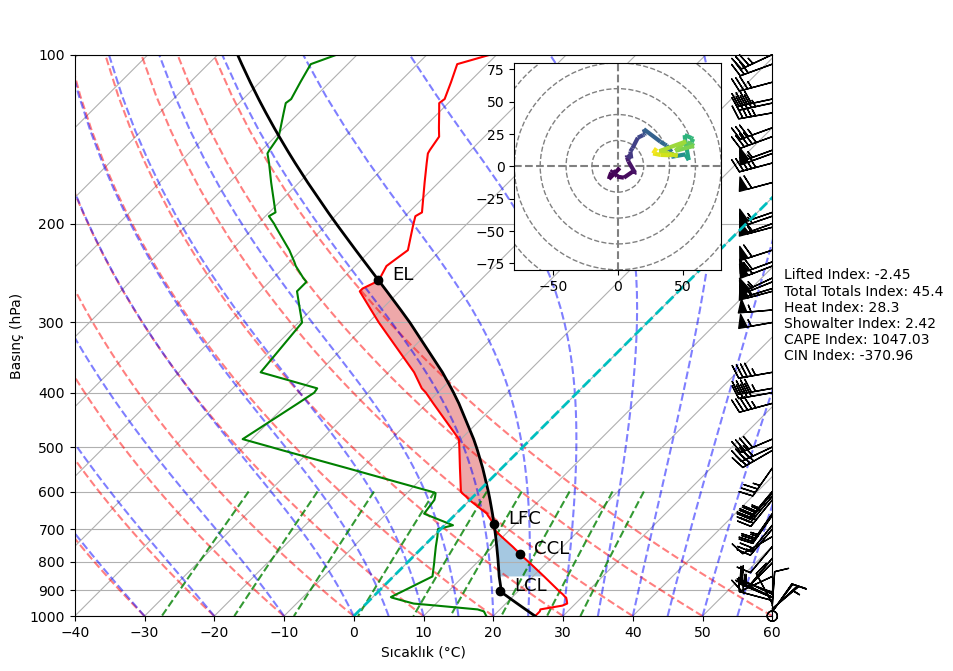

In [112]:
fig = plt.figure(figsize=(9, 9))
skew = SkewT(fig, rotation=45)

skew.plot(p_sounding, T_sounding, 'r')
skew.plot(p_sounding, Td_sounding, 'g')
skew.plot_barbs(p_sounding, u_sounding, v_sounding)
skew.ax.set_ylim(1000, 100)
skew.ax.set_xlim(-40, 60)

skew.ax.set_xlabel(f'Sıcaklık ({T_sounding.units:~P})')
skew.ax.set_ylabel(f'Basınç ({p_sounding.units:~P})')

skew.plot(lcl_pressure, lcl_temperature, 'ko', markerfacecolor='black')
skew.plot(lfc_pressure, lfc_temperature, 'ko', markerfacecolor='black')
skew.plot(el_pressure, el_temperature, 'ko', markerfacecolor='black')
skew.plot(ccl_pressure, ccl_temperature, 'ko', markerfacecolor='black')

plt.text(lcl_temperature.magnitude + 2, lcl_pressure, 'LCL', fontsize=13)
plt.text(lfc_temperature.magnitude + 2, lfc_pressure, 'LFC', fontsize=13)
plt.text(el_temperature.magnitude + 2, el_pressure, 'EL', fontsize=13)
plt.text(ccl_temperature.magnitude + 2, ccl_pressure, 'CCL', fontsize=13)

plt.text(25, 350, f'Lifted Index: {round(li_index.magnitude[0], 2)}\nTotal Totals Index: {round(tt_index.magnitude, 2)}\nHeat Index: {round(k_index.magnitude, 2)}\nShowalter Index: {round(showalter_index.magnitude[0], 2)}\nCAPE Index: {round(cape_index.magnitude, 2)}\nCIN Index: {round(cin_index.magnitude, 2)}')

skew.plot(p_sounding, prof, 'k', linewidth=2)

skew.shade_cin(p_sounding, T_sounding, prof, Td_sounding)
skew.shade_cape(p_sounding, T_sounding, prof)

skew.ax.axvline(0, color='c', linestyle='--', linewidth=2)

skew.plot_dry_adiabats()
skew.plot_moist_adiabats()
skew.plot_mixing_lines()

ax_hod = inset_axes(skew.ax, '30%', '30%', bbox_to_anchor=(25, 35, 750, 690))
h = Hodograph(ax_hod, component_range=80.)
h.add_grid(increment=20)
h.plot_colormapped(u_sounding, v_sounding, hgt_sounding)

plt.show()